In [1]:
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt
import cv2 as cv
import pandas as pd
import os
import glob
import numpy as np
from numpy.linalg import norm

import seaborn as sns
from tensorflow.keras.layers import *
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.applications.de import ResNet50, preprocess_input

from tensorflow import reduce_sum
from tensorflow.keras import Model
import random
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from keras import backend as K
from skimage.measure import label, regionprops
import gc
import json
from PIL import Image
import pickle
import os
from os.path import join
from os import listdir
import matplotlib.pyplot as plt
import math
import time
from tqdm import tqdm
import seaborn as sn
import warnings
warnings.filterwarnings('ignore')
#%matplotlib inline
#https://www.tensorflow.org/lite/models/pose_estimation/overview

Using TensorFlow backend.


### Module_1 Pose Classifier

-https://www.tensorflow.org/lite/models/pose_estimation/overview
-https://programmer.group/analysis-of-official-post-energy-model-of-tensorflow.html
-https://medium.com/roonyx/pose-estimation-and-matching-with-tensorflow-lite-posenet-model-ea2e9249abbd (code Referenced link)

In [2]:
class Module1:
    def __init__(self):
        #self.path  = path
        model_path = "D:\Appliedaicourse\Casestudy2\posenet_mobilenet_v1_100_257x257_multi_kpt_stripped.tflite"
        self.interpreter = tf.lite.Interpreter(model_path=model_path)
        self.interpreter.allocate_tensors()
        # Get input and output tensors information from the model file
        self.input_details = self.interpreter.get_input_details()
        self.output_details = self.interpreter.get_output_details()
        
    def model_output(self,path):
        '''
        Input: path of the image
        Output: HeatMap, Offsets'''
        template_image_src = cv.imread(path)
        template_image = cv.resize(template_image_src, (257, 257))
        template_input = np.expand_dims(template_image.copy(), axis=0)
        floating_model = self.input_details[0]['dtype'] == np.float32

        if floating_model:
            template_input = (np.float32(template_input) - 127.5) / 127.5
        # Process template image
        # Sets the value of the input tensor
        self.interpreter.set_tensor(self.input_details[0]['index'], template_input)
        # Runs the computation
        self.interpreter.invoke()
        # Extract output data from the interpreter
        template_output_data = self.interpreter.get_tensor(self.output_details[0]['index'])
        template_offset_data = self.interpreter.get_tensor(self.output_details[1]['index'])
        # Getting rid of the extra dimension
        template_heatmaps = np.squeeze(template_output_data)
        template_offsets = np.squeeze(template_offset_data)
        #print("template_heatmaps' shape:", template_heatmaps.shape)
        #print("template_offsets' shape:", template_offsets.shape)
        return template_heatmaps,template_offsets
    def parse_output(self,heatmap_data,offset_data, threshold):
        '''
        Input:
        heatmap_data - hetmaps for an image. Three dimension array
        offset_data - offset vectors for an image. Three dimension array
        threshold - probability threshold for the keypoints. Scalar value
        Output:
        array with coordinates of the keypoints and flags for those that have
        low probability
        COnd: If nose and (any one eye) and (any one hip) and (any one ankle) is present then only Bool will be True
        '''

        joint_num = heatmap_data.shape[-1]
        pose_kps = np.zeros((joint_num,3), np.uint32)

        for i in range(heatmap_data.shape[-1]):
            joint_heatmap = heatmap_data[...,i]
            max_val_pos = np.squeeze(np.argwhere(joint_heatmap==np.max(joint_heatmap)))
            remap_pos = np.array(max_val_pos/8*257,dtype=np.int32)
            pose_kps[i,0] = int(remap_pos[0] + offset_data[max_val_pos[0],max_val_pos[1],i])
            pose_kps[i,1] = int(remap_pos[1] + offset_data[max_val_pos[0],max_val_pos[1],i+joint_num])
            max_prob = np.max(joint_heatmap)

            if max_prob > threshold:
                if pose_kps[i,0] < 257 and pose_kps[i,1] < 257:
                    pose_kps[i,2] = 1
            bool = (pose_kps[0][2]==1) and ((pose_kps[1][2] or pose_kps[2][2]) ==1) and ((pose_kps[11][2] or pose_kps[12][2]) ==1) and ((pose_kps[15][2] or pose_kps[16][2]) ==1)
        return bool
    def final(self,path):
        '''
        Input: path of the Image 
        output: Bool true or flase 
        Explanation : it takes path and it sends to model to get the 
        output and it sends to parse output function to get wheater it is a full pose or not'''
        template_heatmaps,template_offsets = self.model_output(path)
        bool = self.parse_output(template_heatmaps,template_offsets,0.5)
        return bool
    

In [22]:
m1 = Module1()

In [23]:
start = time.time()
print(m1.final(path='D:\Appliedaicourse\Casestudy2\data\women_shirts_tops_tees\\image10_4.jpg'))
print("Time Taken : {}".format(time.time()-start))

True
Time Taken : 0.17571783065795898


## Modue-2 Article detection and Localization of Clothes

In [1]:
##https://www.kaggle.com/pednoi/training-mask-r-cnn-to-be-a-fashionista-lb-0-07 
##The training with MaskRcnn is adopted from this kernel

In [209]:
os.chdir('Mask_RCNN')
import sys
sys.path.append('Mask_RCNN')
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

In [210]:
with open('D:\\Appliedaicourse\\Casestudy2\\data\\label_descriptions.json') as f:
    label_descriptions = json.load(f)

label_names = [x['name'] for x in label_descriptions['categories']]
print(len(label_names),label_names[:5])

46 ['shirt, blouse', 'top, t-shirt, sweatshirt', 'sweater', 'cardigan', 'jacket']


In [211]:

class FashionConfig(Config):
    NAME = "fashion"
    NUM_CLASSES = 46 + 1 # +1 for the background class
    
    GPU_COUNT = 1
    IMAGES_PER_GPU = 4 # a memory error occurs when IMAGES_PER_GPU is too high
    
    BACKBONE = 'resnet50'
    
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512    
    IMAGE_RESIZE_MODE = 'none'
    
    RPN_ANCHOR_SCALES = (16, 32, 64, 128, 256)
    #DETECTION_NMS_THRESHOLD = 0.0
    
    # STEPS_PER_EPOCH should be the number of instances 
    # divided by (GPU_COUNT*IMAGES_PER_GPU), and so should VALIDATION_STEPS;
    # however, due to the time limit, I set them so that this kernel can be run in 9 hours
    STEPS_PER_EPOCH = 1000
    VALIDATION_STEPS = 200
    
config = FashionConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     4
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 4
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                59
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              none
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                

In [212]:

class InferenceConfig(FashionConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

model = modellib.MaskRCNN(mode='inference', 
                          config=inference_config,
                          model_dir='\\D:\Appliedaicourse\Casestudy2\\')

model_path1 ='D:/Appliedaicourse/Casestudy2/mask_rcnn_fashion_0005-0.34882.h5'
assert model_path1 != '', "Provide path to trained weights"


print("Loading weights from ", model_path1)
model.load_weights(model_path1, by_name=True)#load trained model

Loading weights from  D:/Appliedaicourse/Casestudy2/mask_rcnn_fashion_0005-0.34882.h5


In [213]:
#combine categories for simplification
foot_wear = ['shoe']

upper_body_wear = ['vest','top, t-shirt, sweatshirt','sweater','sleeve','shirt, blouse','neckline','lapel','jacket','hood',
              'epaulette','collar','cardigan',]
lower_body_wear =['pocket', 'pants', 'shorts', 'skirt']
wholebody = ['cape', 'coat', 'dress', 'jumpsuit']


In [219]:
class Module2:
  
    def resize_image(self,image_path):
        img = cv2.imread(image_path)
        ## Changing Image from BLUE_Greenn_Red to Red_Green_Blue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ## Resizing Image
        img = cv2.resize(img, (512, 512), interpolation=cv2.INTER_AREA)  
        return img
    def get_bbox(self,image_path):
        '''input: Takes the  image_path
        output: it detects the mask,bboxes and 
        also it send the dictionary contains with class id,score,masks,boxes'''
    
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
        result = model.detect([self.resize_image(image_path)])
    
        if result[0]['masks'].size > 0:
            mask = np.zeros((image.shape[0], image.shape[1], result[0]['masks'].shape[-1]), dtype=np.uint8)
            for m in range(result[0]['masks'].shape[-1]):
                mask[:, :, m] = cv2.resize(result[0]['masks'][:, :, m].astype('uint8'), 
                                        (image.shape[1], image.shape[0]), interpolation=cv2.INTER_NEAREST)
            y = image.shape[0]/512
            x = image.shape[1]/512
            boxes = (result[0]['rois'] * [y, x, y, x]).astype(int)
        
        else:
            mask, boxes = result[0]['masks'], result[0]['boxes']
        visualize.display_instances(image, boxes, mask, result[0]['class_ids'], 
                                ['bg']+label_names, result[0]['scores'],
                                 figsize=(8, 8))
        
        return image,mask,boxes,result
    def get_bounding_box_for_parts(self,img,boxes,result,class_names):
        '''Input : image,boxes result from model,class_names list
        Output : returns a tuple of 3 list contain foot,upper_wear,lower_body wear'''
    
        #boxes = result[0]['rois']
        class_id = result[0]['class_ids']
        scores = result[0]['scores']
        masks = result[0]['masks']
        height , width = img.shape[:2]
        foot  = []
        upper_body = []
        lower_body = []
        whole_bod = []
    
        bool =  result[0]['rois'].shape[0] == result[0]['masks'].shape[-1] == result[0]['class_ids'].shape[0]
        if bool:
            if boxes is not None:
                for i in range(len(boxes)):
                    y1,x1,y2,x2 = boxes[i]
                    label  = class_names[class_id[i]-1]
                    score_got  = scores[i] if scores is not None else 0
                    if score_got >0.70:
                        if label in foot_wear:
                            foot.append((y1,x1,y2,x2))
                        if label in upper_body_wear:
                            upper_body.append((y1,x1,y2,x2))
                        if label in lower_body_wear:
                            lower_body.append((y1,x1,y2,x2))
                        if label in wholebody:
                            whole_bod.append((y1,x1,y2,x2))
        return upper_body,lower_body,foot
    ## Getting only the objects from the image
    def crop(self,y1,x1,y2,x2,image):
        '''Input : co-ordinates,image
           It will crop the image with the given co-ordinates
           output: croped image'''
    
        output = image[int(y1):int(y2), int(x1):int(x2)]
        return output

    def get_croped_images(self,upper_wear,lower_wear,foot_wear,img):
        
        '''Input :bounding_box of upper_wear,lower_wear,foot_wear
           Function -> This function will take the boundign box of upperwears like sleeve shirt pocket in this it will combine
           all the bounding box parts of the particular portion and return the images of particular wear.
           output : It returns the Upper_wear,Lower_wear,Foot wear Images'''
        ##getting full upper_body cropping
        if all([len(lower_wear)!=0, len(upper_wear)!=0 , len(foot_wear)!=0]):
        
            up_y1,up_x1 = np.min(np.array(upper_wear),axis=0)[:2]
            up_y2,up_x2 = np.max(np.array(upper_wear),axis=0)[2:]
            upper_image = self.crop(up_y1,up_x1,up_y2,up_x2,img)
            #Getting LowerImage
            L_y1,L_x1 =   np.min(np.array(lower_wear),axis=0)[:2]
            L_y2,L_x2 =   np.max(np.array(lower_wear),axis=0)[2:]
            lower_image = self.crop(L_y1,L_x1,L_y2,L_x2,img)
            ## Getting foot_wear
            F_y1,F_x1   = np.min(np.array(foot_wear),axis=0)[:2]
            F_y2,F_x2   = np.max(np.array(foot_wear),axis=0)[2:]
            foot_image  = self.crop(F_y1,F_x1,F_y2,F_x2,img)
            return upper_image,lower_image,foot_image
        else:
            print('Missing parts')
            return None
    def plot_wears(self,image_path):
        '''Input : Image_path
        Function -> This function will plot images merging with upper_wear, lower_wear and Foot wear predicted from the model
        Output : Image of Upperwear, LowerWear and Footwear'''
        start = time.time()
        
        image,mask,boxes,result = self.get_bbox(image_path)
        a,b,c = self.get_bounding_box_for_parts(image,boxes,result,label_names)
        temp = self.get_croped_images(a,b,c,image)
        if temp!=None:
            '''for i in temp:
                plt.imshow(i)
                plt.show()
                print(i.shape)'''
            return temp[0],temp[1],temp[2]
        else:
            print("Cant be Done")
        end = time.time()
        print("Time Taken: {}".format(end-start))
        print('\n')
        return temp[0],temp[1],temp[2]

        
    
    

In [220]:
m2 = Module2()

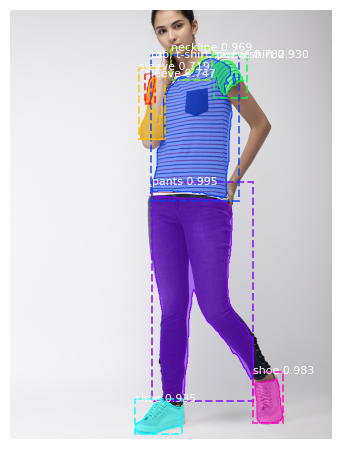

6.539854049682617


In [221]:
s = time.time()
a,b,c = m2.plot_wears(image_path='D:\Appliedaicourse\Casestudy2\data\women_jeans_jeggings\image0_3.jpg')
print(time.time()-s)

### Module_3 Embeddings

In [2]:
# #https://www.oreilly.com/library/view/practical-deep-learning/9781492034858/ch04.html


In [28]:
class Module3:
    def __init__(self):
        
        self.model = tf.keras.applications.DenseNet121(include_top=False, weights='imagenet', input_tensor=None, 
                                                       input_shape=(512,512,3),pooling='max')
    def extract_features(self,img):
        '''Input :  Image and pretrained densenet12 model 
           output : Image Embedings of size 1024 for an Image'''
        preprocessed_img = preprocess_input(np.expand_dims(cv2.resize(img,(512,512)),axis=0))
        #print(type(norm(preprocessed_img)))
        features = self.model.predict(preprocessed_img)
        flattened_features = features.flatten()
        normalized_features = flattened_features / norm(flattened_features)
        return normalized_features

In [37]:
m3 = Module3()
start = time.time()
gg = m3.extract_features(img = a)
print(time.time()-start)

3.957416534423828


In [62]:
a,b,c = m3.extract_features(img = a),m3.extract_features(img = b),m3.extract_features(img = c)

### Nearest embeding model Loading

In [85]:
class Module4:
    ''' This module will give the path of similar images by loading 
    pretrained models of nearest neighbour of particular upper or lower or foot wear'''
    def __init__(self):

        self.upmodel = pickle.load(open('D:\Appliedaicourse/Casestudy2/UpperModel.pkl','rb'))
        self.lomodel = pickle.load(open('D:\Appliedaicourse\Casestudy2\LowerModel.pkl','rb'))
        self.fomodel = pickle.load(open('D:\Appliedaicourse\Casestudy2\FootModel.pkl','rb'))
        self.upperwear=pickle.load(open(r'D:\Appliedaicourse\Casestudy2\UpperWear.pkl','rb'))
        self.lowerwear=pickle.load(open(r'D:\Appliedaicourse\Casestudy2\lowerwear.pkl','rb'))
        self.footwear= pickle.load(open(r'D:\Appliedaicourse\Casestudy2\FootWear.pkl','rb'))
        
    def get_images(self,upper,lower,foot):
        '''Input : Embedings of lower,upper,foot 
           output : It gives the path of similar_products'''
        distances1, indices1 = self.upmodel.kneighbors([upper])
        distances2, indices2 = self.lomodel.kneighbors([lower])
        distances3, indices3 = self.fomodel.kneighbors([foot])
        upper_paths = self.upperwear['Path'][indices1[0]]
        lower_paths = self.lowerwear['Path'][indices1[0]]
        foot_paths  = self.footwear['Path'][indices1[0]]
        
        return upper_paths,lower_paths,foot_paths
        

In [86]:
## Creating a object or instance for class
m1 = Module1()
m2 = Module2()
m3 = Module3()
m4 = Module4()

In [175]:
def print_result(part,path):
    plt.imshow(part)
    plt.show()
    print('** Recomendation ***')
    w=10
    h=10
    fig=plt.figure(figsize=(20,20))
    columns = 5
    rows = 5
    for i in range(1, columns*rows +1):
        img = cv2.imread('D:\Appliedaicourse\Casestudy2\\data\\'+(path[::-1][i-1]).replace('/','\\'))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img,(512,512))    
        fig.add_subplot(rows, columns, i)
        plt.imshow(img)
    plt.show()

In [160]:

def final(path):
    if m1.final(path=path):
        print('***** Localization & article Detection of an image *****')
        u_plot,l_plot,f_plot = m2.plot_wears(path)
        u,l,f =  m3.extract_features(img = u_plot),m3.extract_features(img = l_plot),m3.extract_features(img = f_plot)
        u,l,f = m4.get_images(u,l,f)
        print('*'*125)
        print('****** ***** Upper_wearing_Recomendataion ***** ****')
        print_result(u_plot,u)
        print('-'*125)
        print('****** ***** lower_wearing_Recomendataion ***** ****')
        print_result(l_plot,l)
        print('-'*120)
        print('****** ***** Foot_wearing_Recomendataion ***** ****')
        print_result(f_plot,f)
        print('-'*120)

        return u,l,f
        
    else:
        print("Not_full_image")


***** Localization & article Detection of an image *****


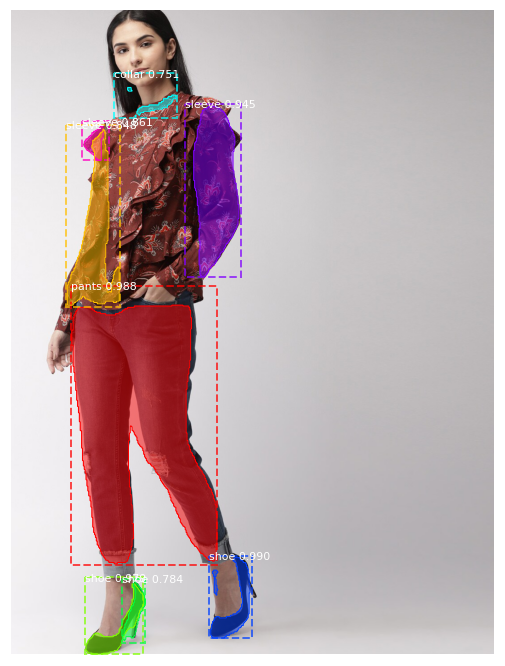

*****************************************************************************************************************************
****** ***** Upper_wearing_Recomendataion ***** ****


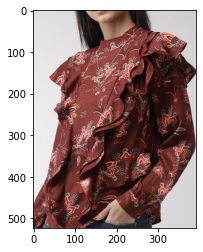

** Recomendation ***


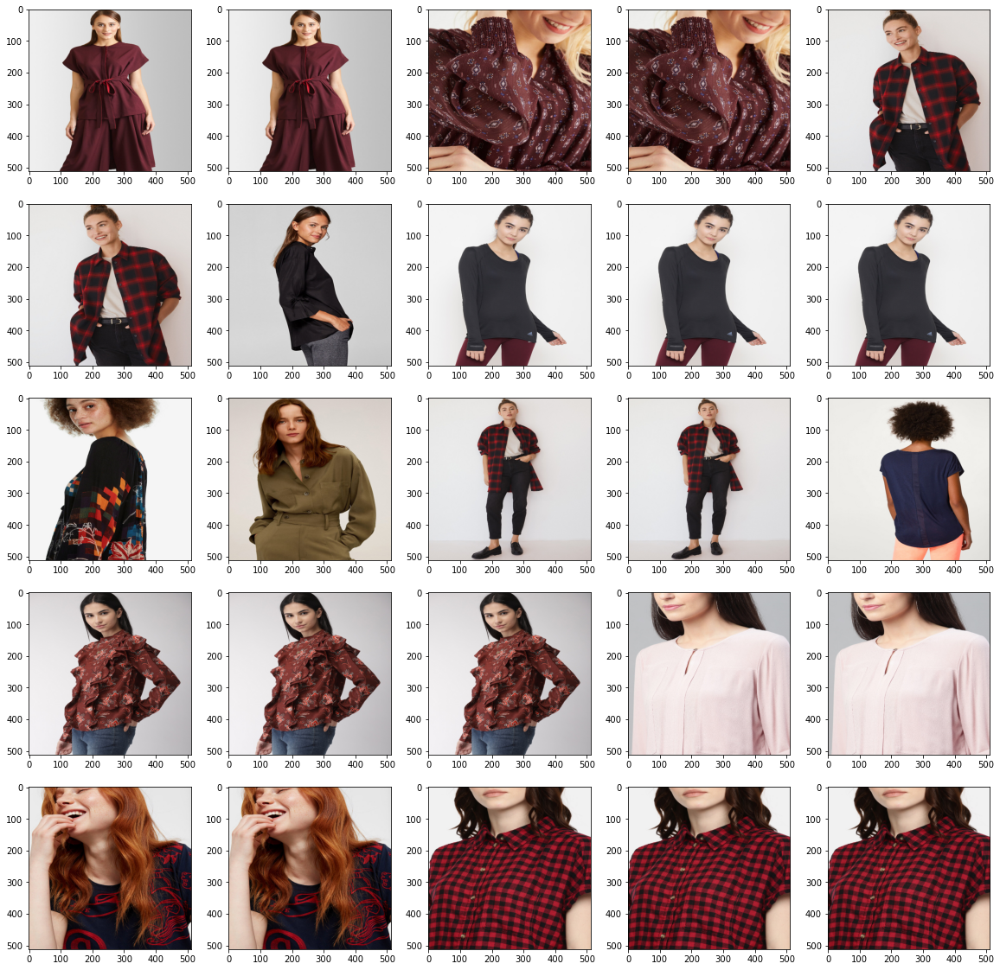

-----------------------------------------------------------------------------------------------------------------------------
****** ***** lower_wearing_Recomendataion ***** ****


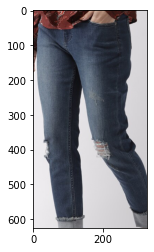

** Recomendation ***


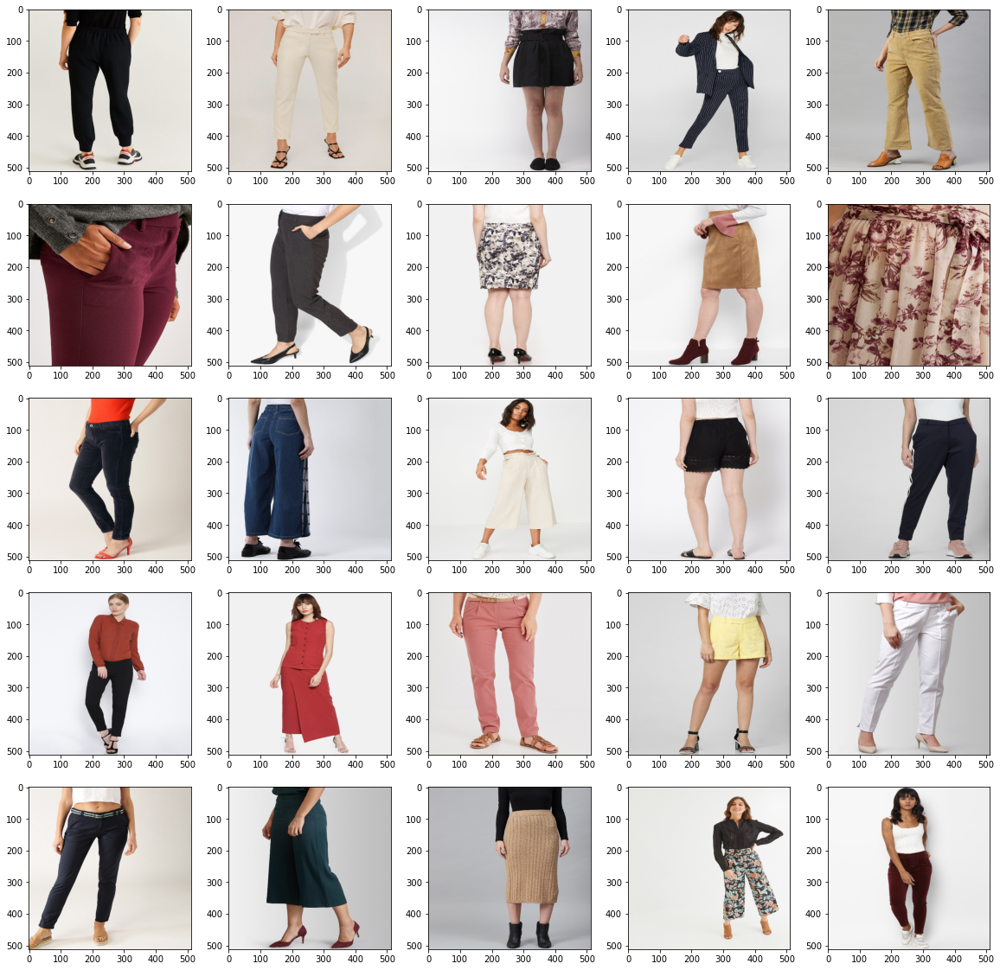

------------------------------------------------------------------------------------------------------------------------
****** ***** Foot_wearing_Recomendataion ***** ****


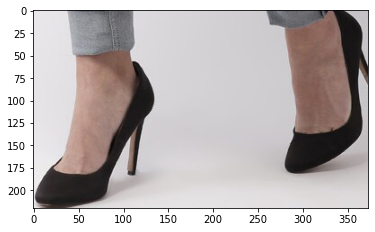

** Recomendation ***


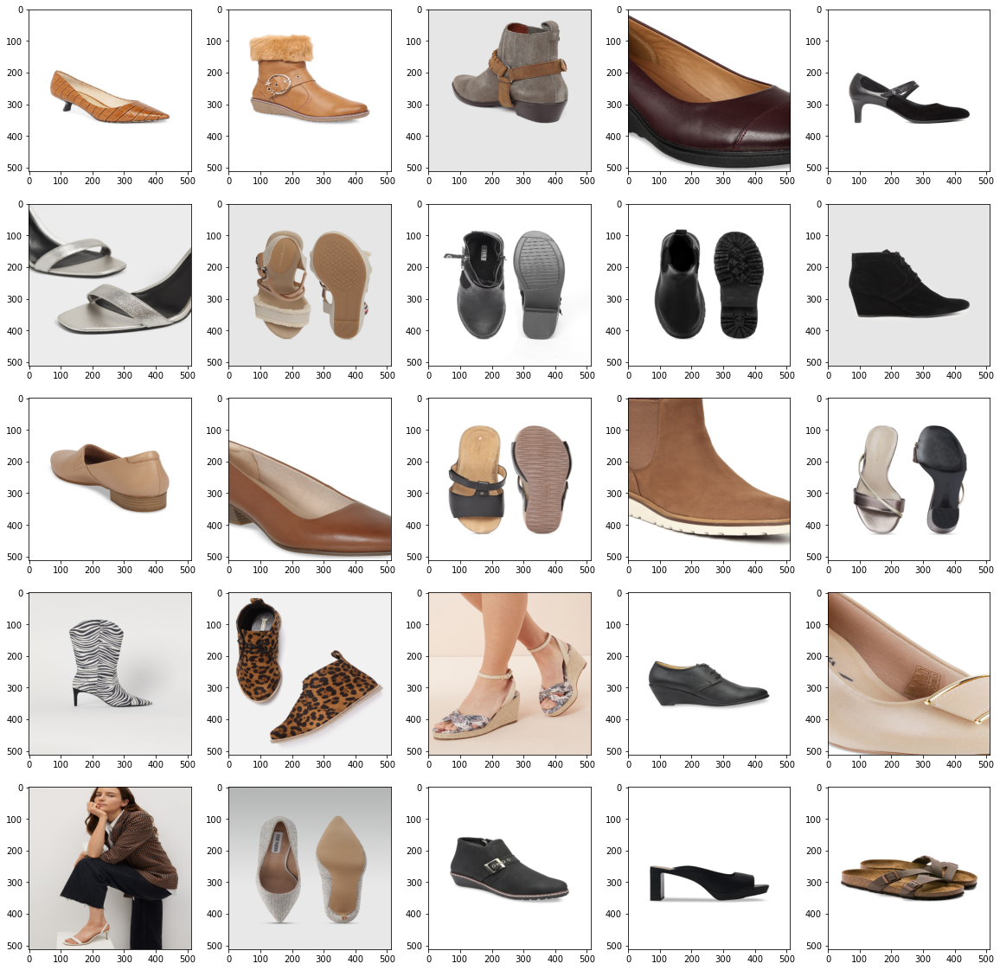

------------------------------------------------------------------------------------------------------------------------
Time Taken : 39.64049458503723


In [164]:
s = time.time()
path = 'D:\Appliedaicourse\Casestudy2\data\women_shirts_tops_tees\image3_4.jpg'
p,o,y = final(path)
print('Time Taken : {}'.format(time.time()-s))

***** Localization & article Detection of an image *****


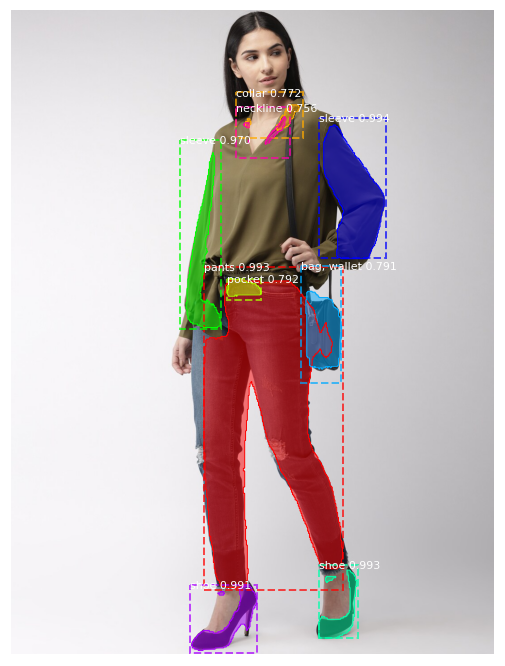

*****************************************************************************************************************************
****** ***** Upper_wearing_Recomendataion ***** ****


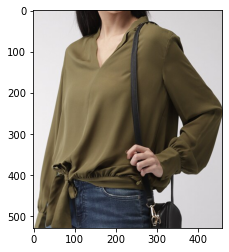

** Recomendation ***


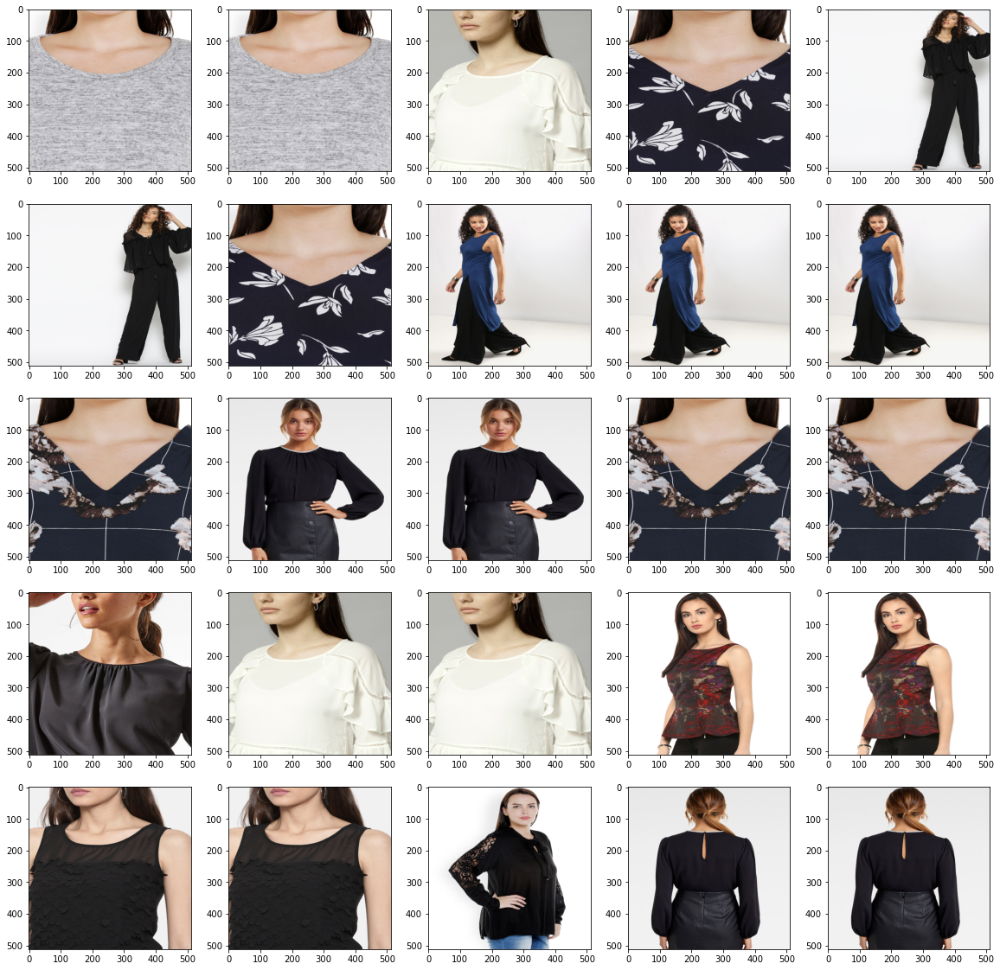

-----------------------------------------------------------------------------------------------------------------------------
****** ***** lower_wearing_Recomendataion ***** ****


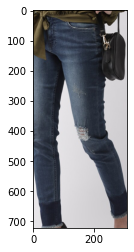

** Recomendation ***


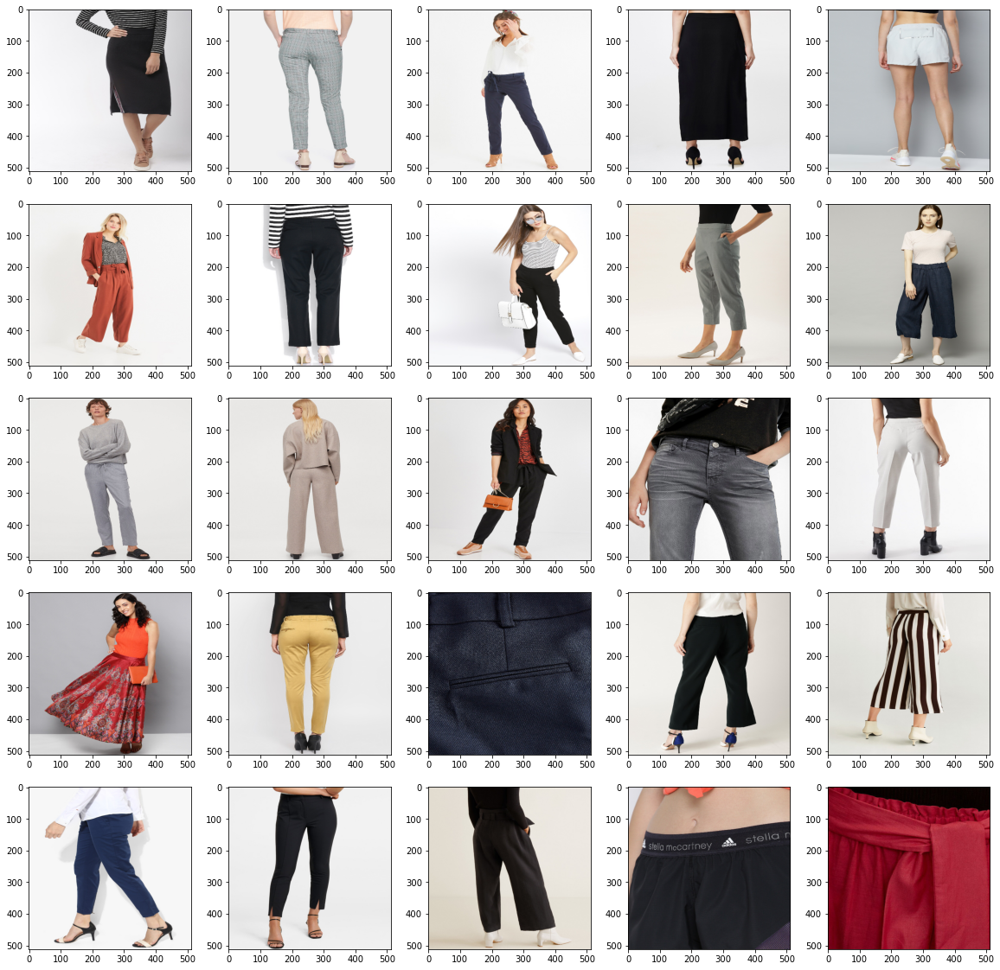

------------------------------------------------------------------------------------------------------------------------
****** ***** Foot_wearing_Recomendataion ***** ****


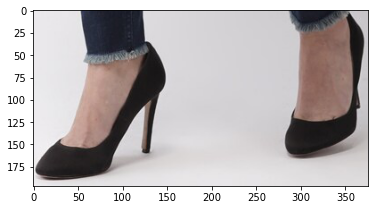

** Recomendation ***


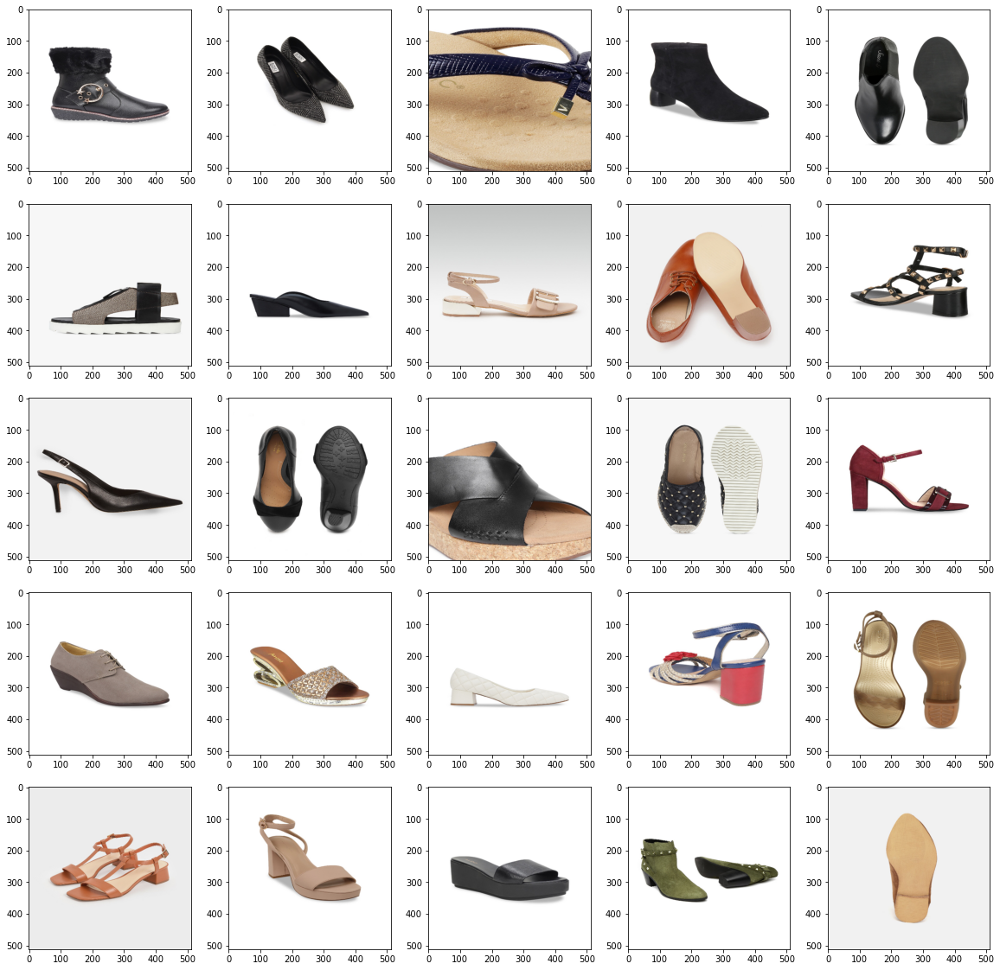

------------------------------------------------------------------------------------------------------------------------
Time Taken : 31.9394748210907


In [165]:
s = time.time()
path = 'D:\Appliedaicourse\Casestudy2\data\women_shirts_tops_tees\image17_4.jpg'
p,o,y = final(path)
print('Time Taken : {}'.format(time.time()-s))

***** Localization & article Detection of an image *****


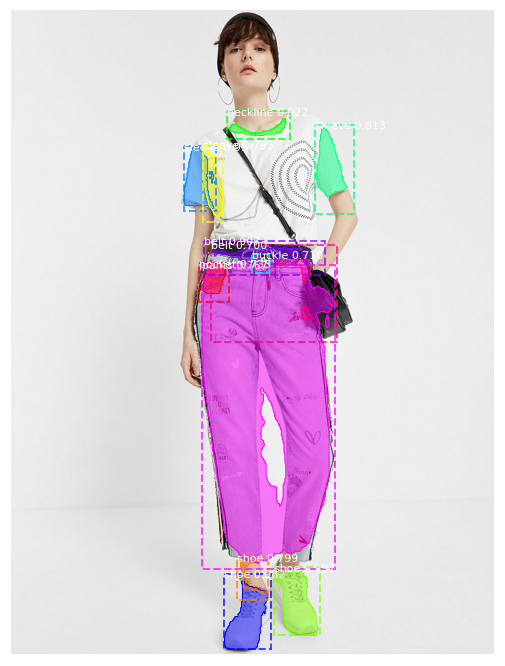

*****************************************************************************************************************************
****** ***** Upper_wearing_Recomendataion ***** ****


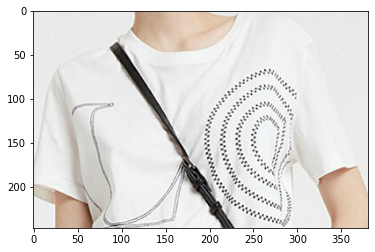

** Recomendation ***


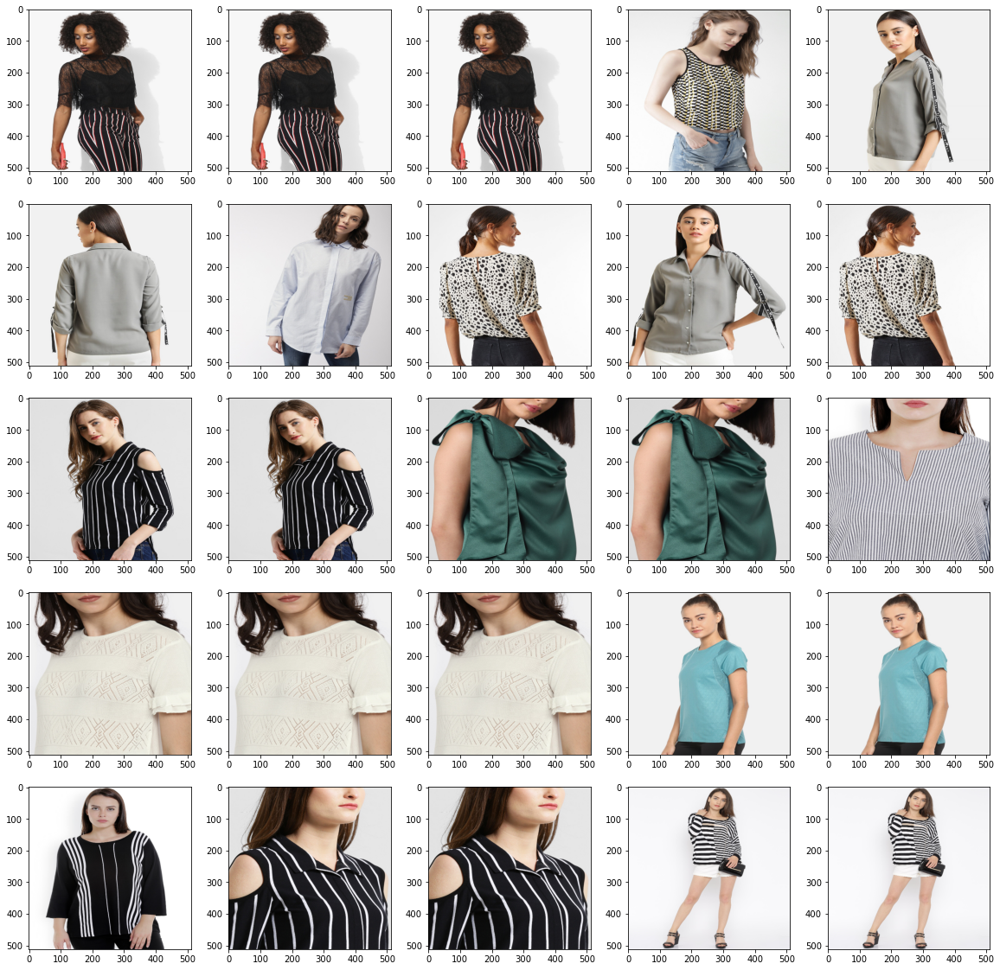

-----------------------------------------------------------------------------------------------------------------------------
****** ***** lower_wearing_Recomendataion ***** ****


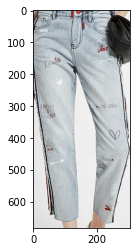

** Recomendation ***


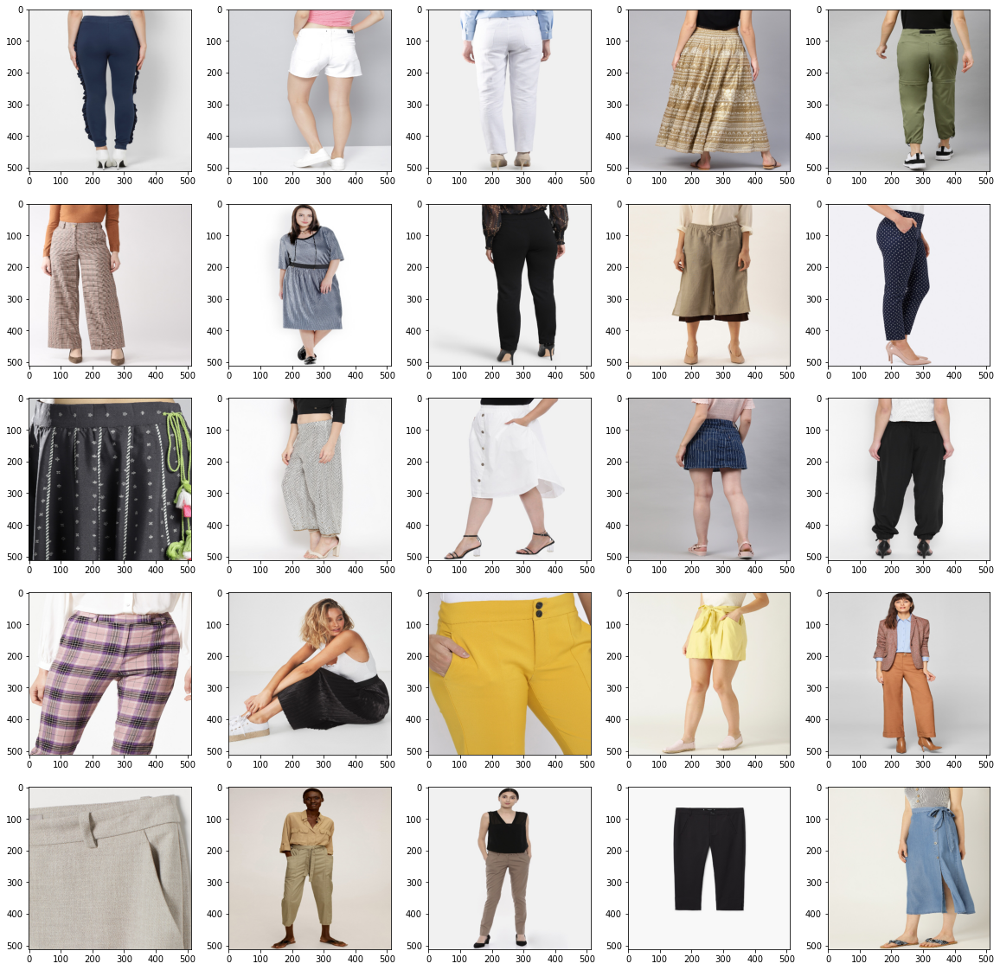

------------------------------------------------------------------------------------------------------------------------
****** ***** Foot_wearing_Recomendataion ***** ****


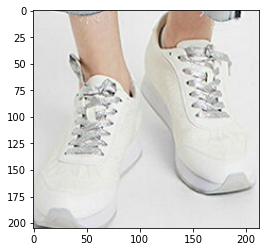

** Recomendation ***


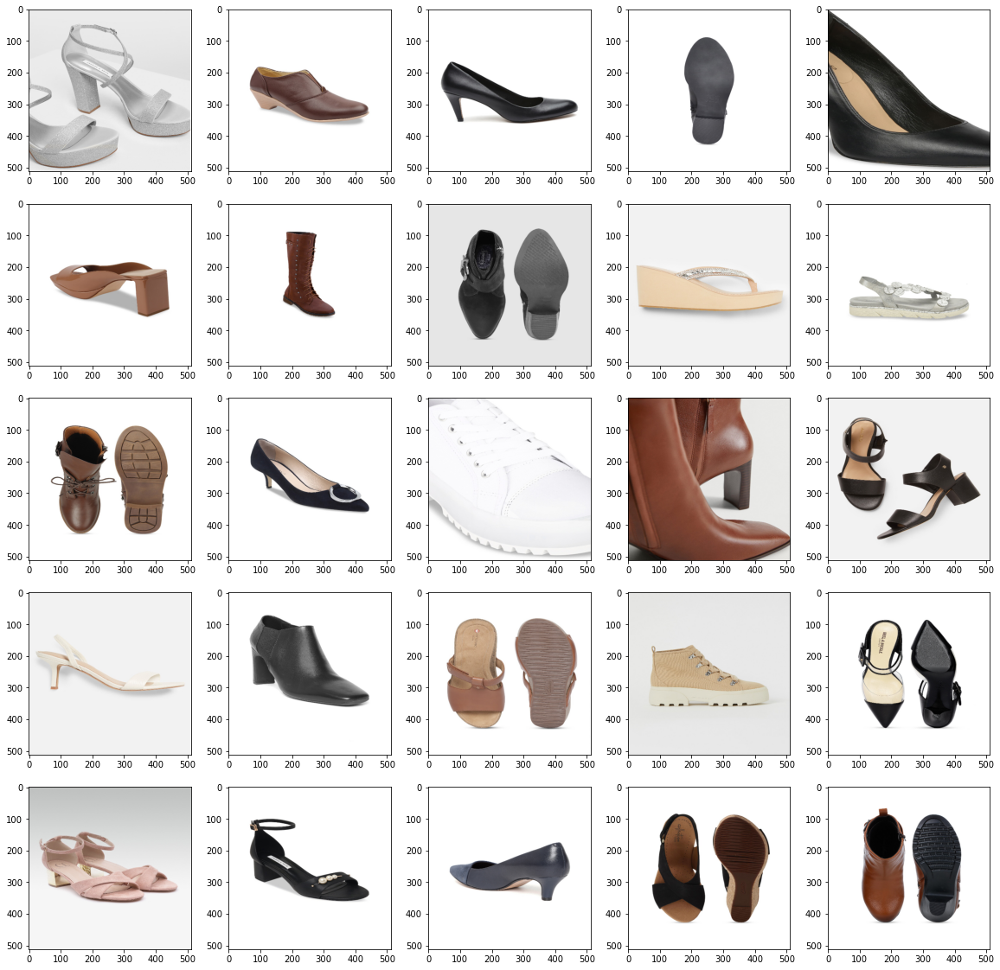

------------------------------------------------------------------------------------------------------------------------
Time Taken : 29.419650077819824


In [170]:
s = time.time()
path = 'D:/Appliedaicourse/Casestudy2/data/women_jeans_jeggings/image11_0.jpg'
p,o,y = final(path)
print('Time Taken : {}'.format(time.time()-s))

***** Localization & article Detection of an image *****


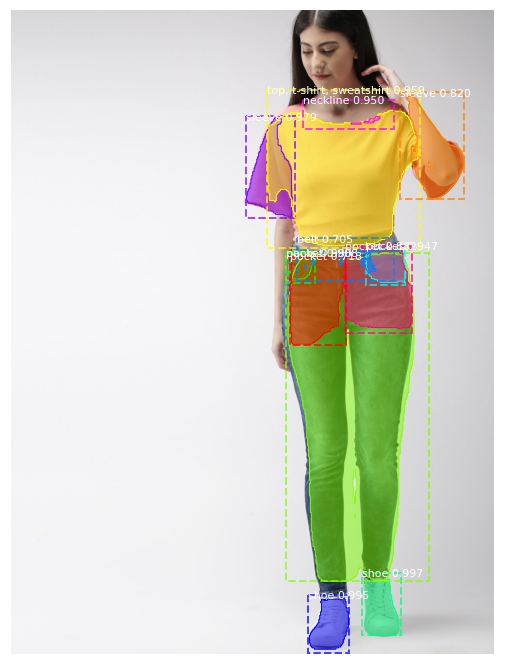

*****************************************************************************************************************************
****** ***** Upper_wearing_Recomendataion ***** ****


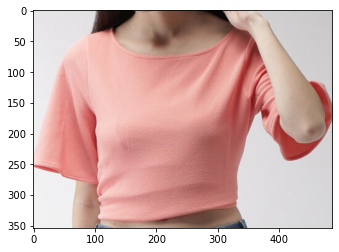

** Recomendation ***


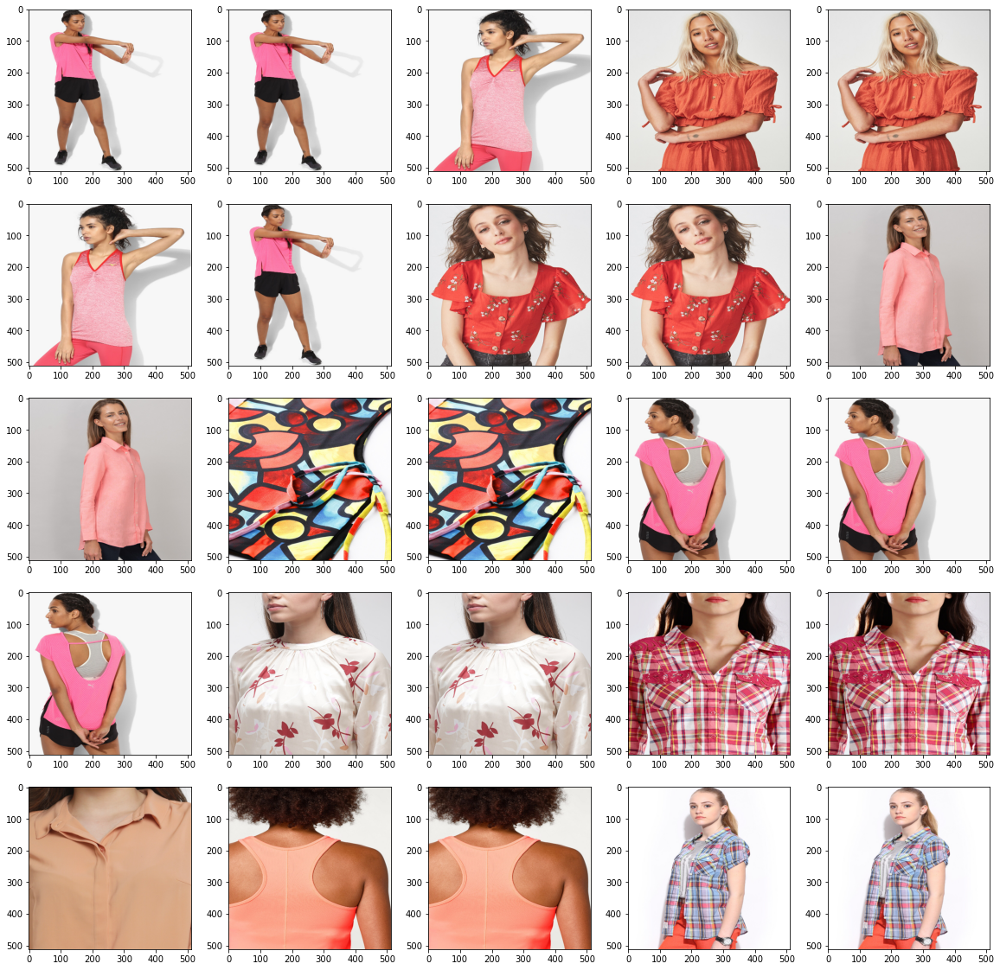

-----------------------------------------------------------------------------------------------------------------------------
****** ***** lower_wearing_Recomendataion ***** ****


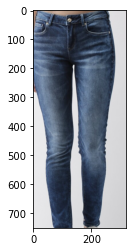

** Recomendation ***


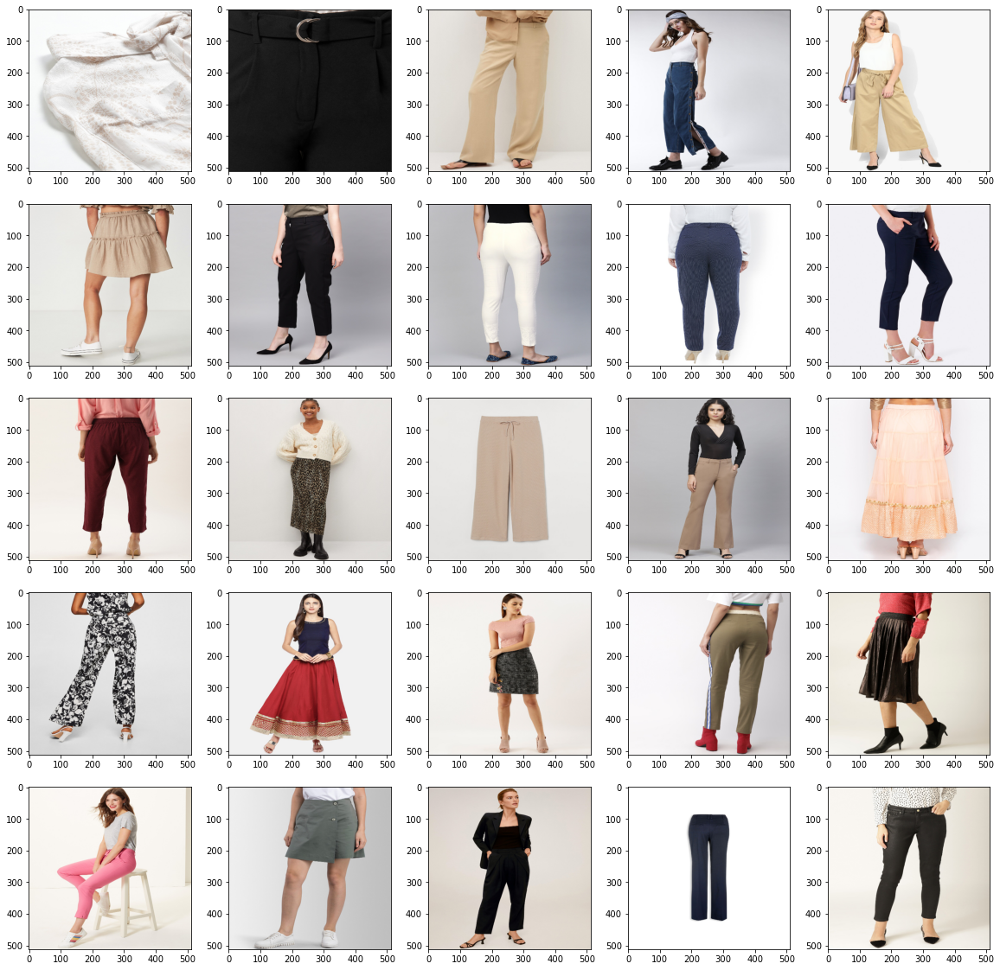

------------------------------------------------------------------------------------------------------------------------
****** ***** Foot_wearing_Recomendataion ***** ****


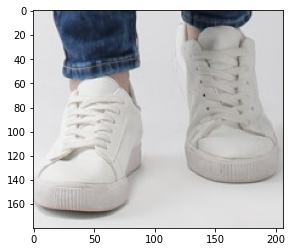

** Recomendation ***


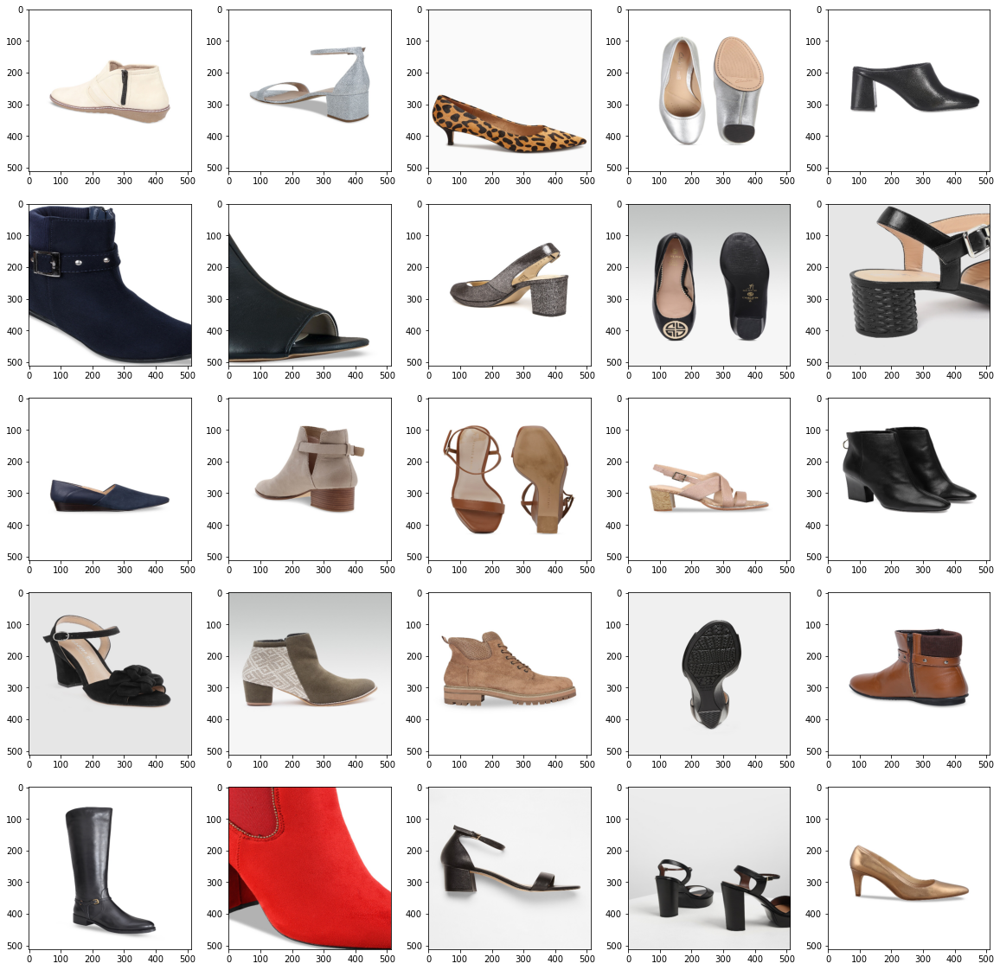

------------------------------------------------------------------------------------------------------------------------
Time Taken : 32.34899306297302


In [171]:
s = time.time()
path = 'D:/Appliedaicourse/Casestudy2/data/women_jeans_jeggings/image4_3.jpg'
p,o,y = final(path)
print('Time Taken : {}'.format(time.time()-s))

***** Localization & article Detection of an image *****


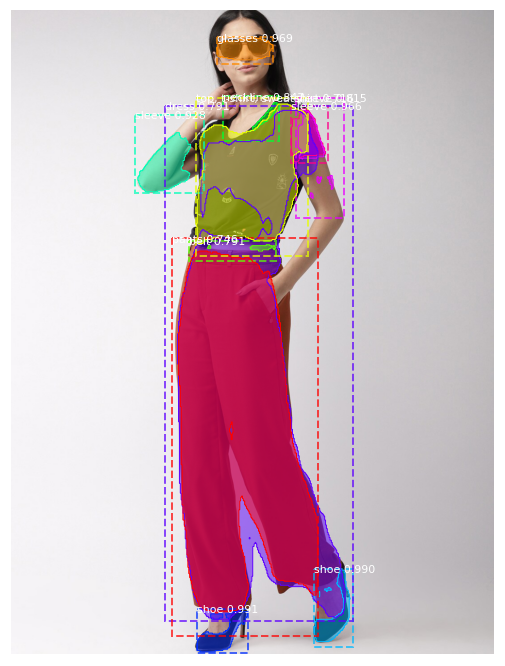

*****************************************************************************************************************************
****** ***** Upper_wearing_Recomendataion ***** ****


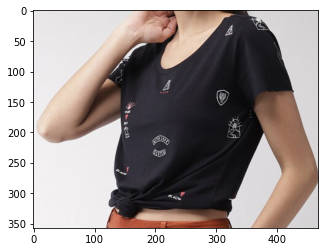

** Recomendation ***


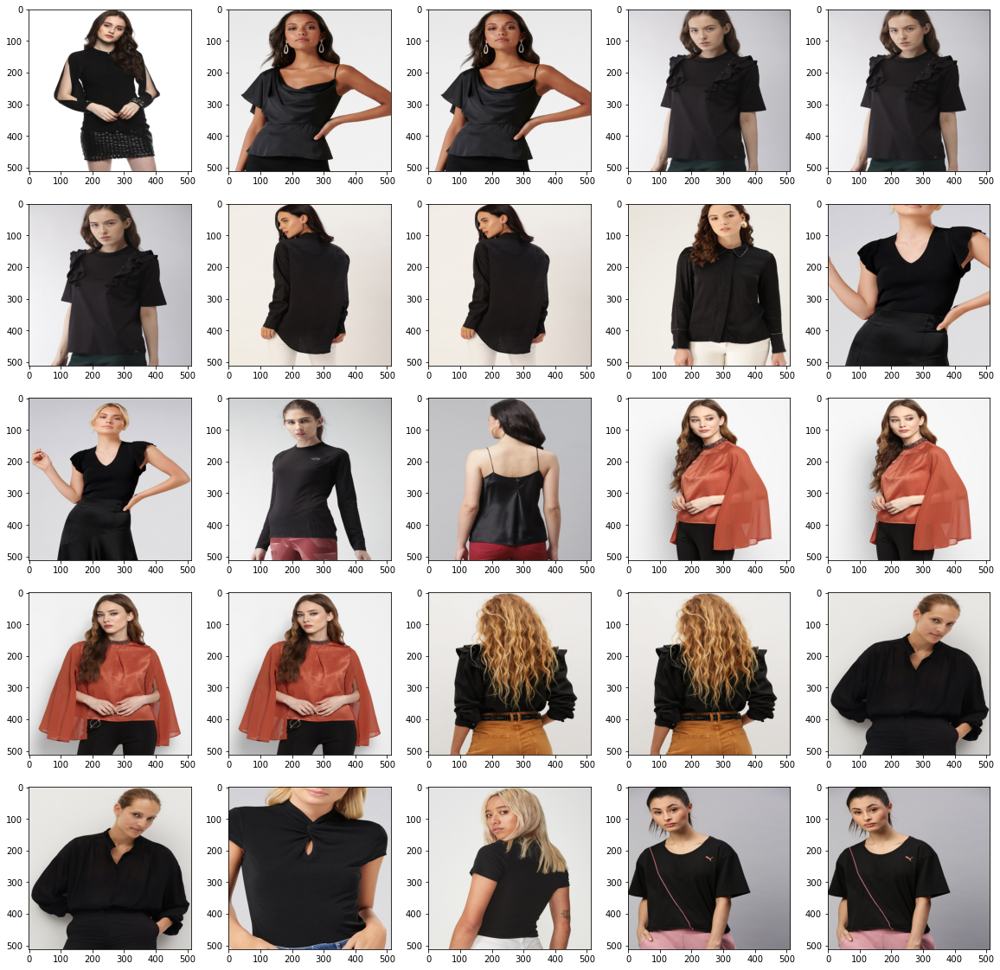

-----------------------------------------------------------------------------------------------------------------------------
****** ***** lower_wearing_Recomendataion ***** ****


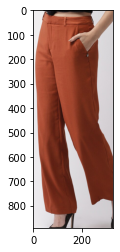

** Recomendation ***


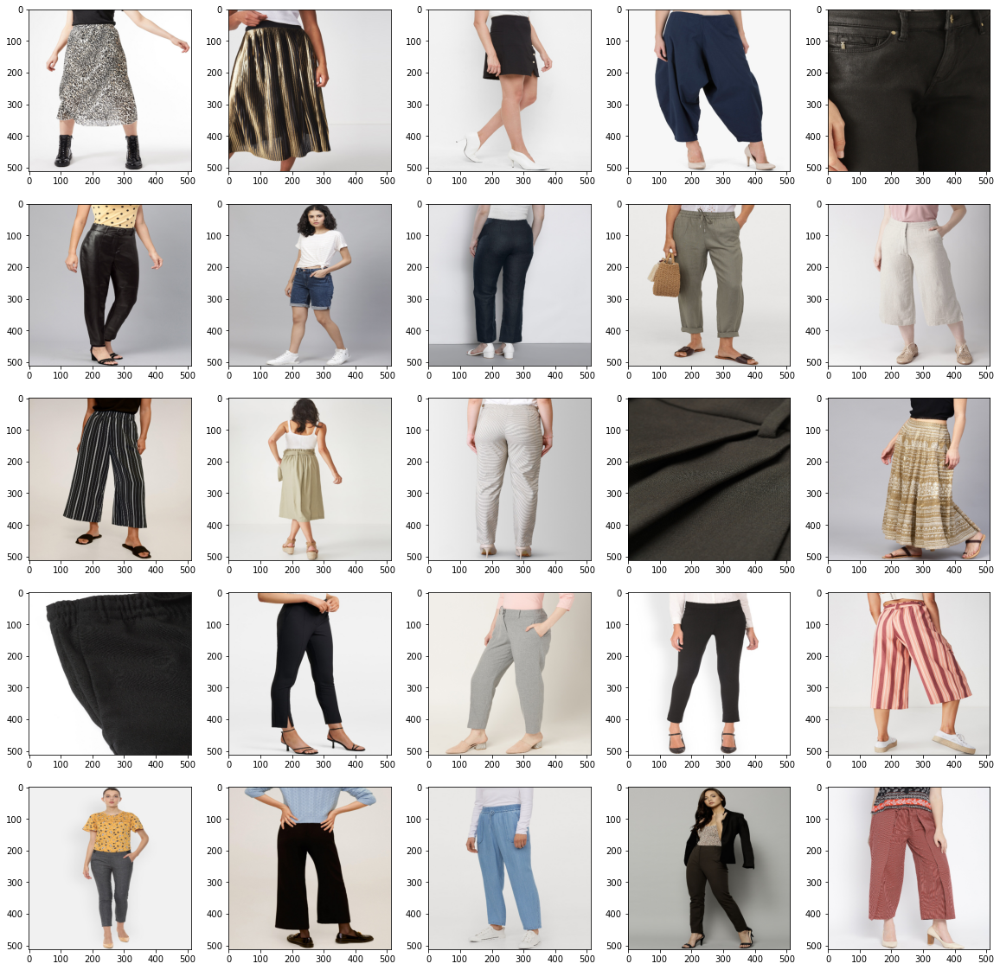

------------------------------------------------------------------------------------------------------------------------
****** ***** Foot_wearing_Recomendataion ***** ****


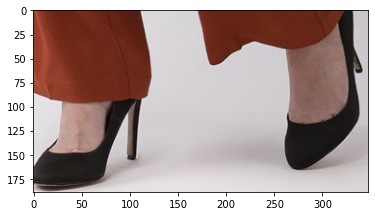

** Recomendation ***


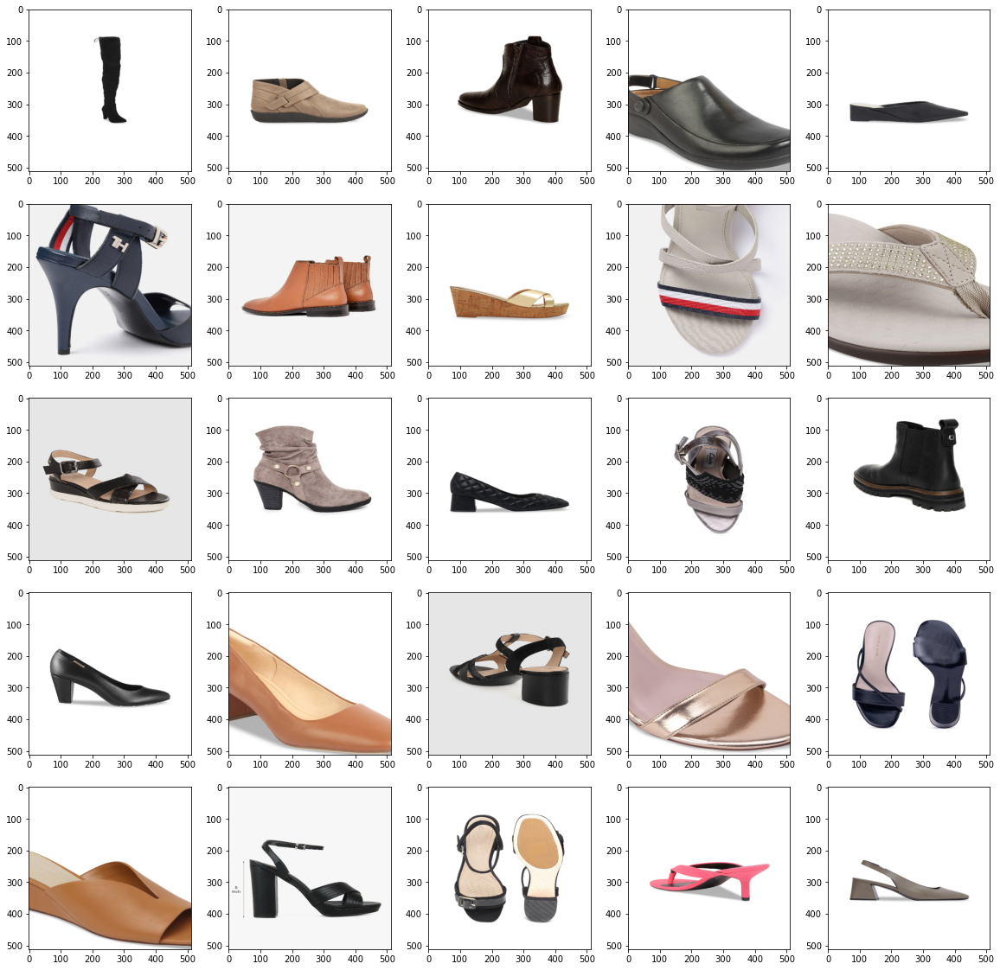

------------------------------------------------------------------------------------------------------------------------
Time Taken : 30.065595149993896


In [176]:
s = time.time()
path = 'D:/Appliedaicourse/Casestudy2/data/women_trousers/image0_3.jpg'
p,o,y = final(path)
print('Time Taken : {}'.format(time.time()-s))